<a href="https://colab.research.google.com/github/Karolina-Bogacka/transbajki/blob/master/forecastking2_the_two_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!ls drive/MyDrive

'Advanced ML (For the Non-Advanced) .gdoc'	'IMG_4438[1705].gdoc'
 Barrows.zip					'IMG_4438[1705].jpg'
 CCPresentationNotes.gdoc			 IMG.gdoc
'CNN letter Dataset'				 IMG.jpg
'Colab Notebooks'				'Inni ludzie.gdoc'
 content					'Jury Mail.gdoc'
 data-local.zip					 masters.gdoc
 data.zip					 master-thesis-results
 Data.zip					'medytujący google docs.gdoc'
'Deprecated: LineOfLeastResistance_Tests.gdoc'	 methodology.gdoc
'dlt :T:T:T:T:T:T:T.gdoc'			 parsed-group.csv
'Dokument bez tytułu (1).gdoc'			'poetry generation.gdoc'
'Dokument bez tytułu.gdoc'			 rowerki
'fl experiments.gdoc'				 rowerki.zip
 frozen_east_text_detection.pb			 ssh.gdoc
 git.gdoc					 Teams.gsheet
 Github						 token.gdoc
'grouped-weather-rowerki(2).csv'		 trolls


In [4]:
! unzip drive/MyDrive/rowerki.zip

Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
  inflating: rowerki/1651998103.csv  
  inflating: rowerki/1651888304.csv  
  inflating: rowerki/1650990104.csv  
  inflating: rowerki/1652010703.csv  
  inflating: rowerki/1651031504.csv  
  inflating: rowerki/1651760504.csv  
  inflating: rowerki/1651965703.csv  
  inflating: rowerki/1651017104.csv  
  inflating: rowerki/1650957705.csv  
  inflating: rowerki/1651953104.csv  
  inflating: rowerki/1651630904.csv  
  inflating: rowerki/1650882104.csv  
  inflating: rowerki/1651423903.csv  
  inflating: rowerki/1651904504.csv  
  inflating: rowerki/1650945103.csv  
  inflating: rowerki/1651846904.csv  
  inflating: rowerki/1651735303.csv  
  inflating: rowerki/1651582303.csv  
  inflating: rowerki/1651922504.csv  
  inflating: rowerki/1651166504.csv  
  inflating: rowerki/1651341103.csv  
  inflating: rowerki/1651906303.csv  
  inflating: rowerki/1651386104.csv  
  inflating: rowerki/1651405903.csv  
  inflating: rowerki/16

# OK, we have 2 ideas here to realize:
#### 1. Forecasting the traffic on a given station for a given day based on previous data in order to estimate how much money are we going to lose if we shut down this station (assuming, for example, that people won't rent bikes that won't be there and will instead choose some different means of transportation)
#### 2. Analyzing where to put the third station by finding the most overcrowded stations (first by looking for stations and how much overcrowded are they throughout the day, then maybe treating the whole thing like a graph and finding neighbouring threes of stations that are frequently overcrowded together)

## 1. Forecasting traffic on a given station
### Load data

In [5]:
!pip install meteostat
!pip install featuretools
!pip install darts

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 354 kB 5.1 MB/s 
     |████████████████████████████████| 281 kB 49.1 MB/s 
     |████████████████████████████████| 179 kB 58.2 MB/s 
     |████████████████████████████████| 207 kB 58.8 MB/s 
     |████████████████████████████████| 1.1 MB 49.2 MB/s 
     |████████████████████████████████| 837 kB 43.0 MB/s 
     |████████████████████████████████| 140 kB 40.0 MB/s 
     |████████████████████████████████| 596 kB 49.4 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Attempting uninstall: cloudpickle
    Found existing installation: cloudpickle 1.3.0
    Uninstalling cloudpickle-1.3.0:
      Successfully uninstalled cloudpickle-1.3.0
  Attempting unins

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 370 kB 5.1 MB/s 
     |████████████████████████████████| 9.8 MB 44.6 MB/s 
     |████████████████████████████████| 65 kB 4.3 MB/s 
     |████████████████████████████████| 585 kB 50.6 MB/s 
     |████████████████████████████████| 11.2 MB 34.2 MB/s 
     |████████████████████████████████| 793 kB 46.4 MB/s 
     |████████████████████████████████| 43 kB 2.3 MB/s 
     |████████████████████████████████| 1.4 MB 43.2 MB/s 
     |████████████████████████████████| 381 kB 56.6 MB/s 
     |████████████████████████████████| 930 kB 45.7 MB/s 
     |████████████████████████████████| 49 kB 5.3 MB/s 
     |████████████████████████████████| 45 kB 3.2 MB/s 
     |████████████████████████████████| 419 kB 42.4 MB/s 
     |████████████████████████████████| 1.1 MB 40.0 MB/s 
     |████████████████████████████████| 144 kB 52.8 MB/s 
     |████████████████████████████████|

In [6]:
import pandas as pd
from functools import partial, reduce
import numpy as np
import requests
import glob
from sklearn.preprocessing import OrdinalEncoder
import matplotlib.pyplot as plt
import math
import datetime
from featuretools.primitives import NumericLag
import seaborn as sns
from datetime import datetime
from meteostat import Point, Daily, Stations, Hourly

/usr/local/lib/python3.7/dist-packages/woodwork/__init__.py:23: FutureWarning: Woodwork may not support Python 3.7 in next non-bugfix release.
  "Woodwork may not support Python 3.7 in next non-bugfix release.", FutureWarning
/usr/local/lib/python3.7/dist-packages/featuretools/__init__.py:67: FutureWarning: Featuretools may not support Python 3.7 in next non-bugfix release.
  FutureWarning,


In [7]:
to_read = glob.glob("rowerki/*.csv")
rowerki_df = pd.concat(map(pd.read_csv, to_read))

In [8]:
rowerki_df.head()

,date,station_id,bike_number,bike_type,state
0,2022-05-28 04:14,2585259,28634,174,ok
1,2022-05-28 04:14,2585259,26715,174,ok
2,2022-05-28 04:14,2585259,26648,174,ok
3,2022-05-28 04:14,2585259,26641,174,ok
4,2022-05-28 04:14,2585259,26462,174,ok


In [9]:
len(rowerki_df)

23307413

### Get the number of incoming bikes
So we need to check for each row of a station whether the bike already appeared in the previous measurement (yeah, so we have the measurements, and that gives us incoming
OR we get the number of bikes for a given measurement and see the fluctuations, and if the number lessens that's potential rented bikes there. So we use the Lazy Consumer Hypothesis xD maybe that if the consumer would have to go to a different station they would choose sth different, whereas the guy renting will just leave the bike anywhere

so get total outgoing clients for a measurement and then for a day

In [ ]:
grouped_df = rowerki_df.groupby(['date', 'station_id'])['bike_number'].nunique().reset_index()
grouped_df.head()

,date,station_id,bike_number
0,2022-04-24 15:44,448565,3
1,2022-04-24 15:44,448566,3
2,2022-04-24 15:44,1154451,6
3,2022-04-24 15:44,2585259,19
4,2022-04-24 15:44,2585263,12


In [ ]:
grouped_df['Day'] = pd.to_datetime(grouped_df['date']).dt.day
grouped_df.head()

,date,station_id,bike_number,Day
0,2022-04-24 15:44,448565,3,24
1,2022-04-24 15:44,448566,3,24
2,2022-04-24 15:44,1154451,6,24
3,2022-04-24 15:44,2585259,19,24
4,2022-04-24 15:44,2585263,12,24


In [ ]:
grouped_df['Month'] = pd.to_datetime(grouped_df['date']).dt.month
grouped_df.head()

,date,station_id,bike_number,Day,Month
0,2022-04-24 15:44,448565,3,24,4
1,2022-04-24 15:44,448566,3,24,4
2,2022-04-24 15:44,1154451,6,24,4
3,2022-04-24 15:44,2585259,19,24,4
4,2022-04-24 15:44,2585263,12,24,4


In [ ]:
grouped_df['Weekday'] = pd.to_datetime(grouped_df['date']).dt.dayofweek
grouped_df.head()

,date,station_id,bike_number,Day,Month,Weekday
0,2022-04-24 15:44,448565,3,24,4,6
1,2022-04-24 15:44,448566,3,24,4,6
2,2022-04-24 15:44,1154451,6,24,4,6
3,2022-04-24 15:44,2585259,19,24,4,6
4,2022-04-24 15:44,2585263,12,24,4,6


here, for each station get to previous measurement and subtract.

In [ ]:
grouped_df.head()

,date,station_id,bike_number,Day,Month,Weekday
0,2022-04-24 15:44,448565,3,24,4,6
1,2022-04-24 15:44,448566,3,24,4,6
2,2022-04-24 15:44,1154451,6,24,4,6
3,2022-04-24 15:44,2585259,19,24,4,6
4,2022-04-24 15:44,2585263,12,24,4,6


In [ ]:
grouped_df['diff'] = -(grouped_df.groupby(['station_id'])['bike_number'].diff(1))
grouped_df['diff'] = [d if d > 0 else 0.0 for d in grouped_df['diff'] ]
grouped_df[grouped_df['station_id']==2585982].head(50)

,date,station_id,bike_number,Day,Month,Weekday,diff
253,2022-04-24 15:44,2585982,9,24,4,6,0.0
594,2022-04-24 15:51,2585982,8,24,4,6,1.0
937,2022-04-24 16:21,2585982,10,24,4,6,0.0
1279,2022-04-24 16:51,2585982,10,24,4,6,0.0
1619,2022-04-24 17:18,2585982,9,24,4,6,1.0
1963,2022-04-24 17:21,2585982,9,24,4,6,0.0
2305,2022-04-24 17:39,2585982,7,24,4,6,2.0
2651,2022-04-24 17:51,2585982,10,24,4,6,0.0
2999,2022-04-24 18:21,2585982,19,24,4,6,0.0
3345,2022-04-24 18:51,2585982,19,24,4,6,0.0


In [ ]:
grouped_df = grouped_df.groupby(['Day', 'station_id', 'Month', 'Weekday'])['diff'].sum().reset_index()
grouped_df[grouped_df['station_id']==2585982].head(50)

,Day,station_id,Month,Weekday,diff
516,1,2585982,5,6,45.0
517,1,2585982,6,2,79.0
1214,2,2585982,5,0,51.0
1215,2,2585982,6,3,65.0
1912,3,2585982,5,1,36.0
1913,3,2585982,6,4,98.0
2610,4,2585982,5,2,32.0
2611,4,2585982,6,5,32.0
3049,5,2585982,5,3,64.0
3398,6,2585982,5,4,42.0


In [ ]:
json = requests.get("https://nextbike.net/maps/nextbike-official.json?city=372,210,475").json()
data = []
for city in json["countries"][0]['cities']:
    for place in city['places']:
        data.append({col: place[col] for col in ['uid', 'lat', 'lng', 'name','bike_racks']})
stations = pd.DataFrame(data)
stations.sort_values("bike_racks")

,uid,lat,lng,name,bike_racks
329,2681635,52.234390,20.999159,Spektrum Tower,11
342,18751910,52.183037,20.991542,Signum Work Station,12
348,55316960,52.196220,20.938810,Bolero,15
76,2585400,52.231450,20.988690,Prosta - Wronia,15
267,2586001,52.247314,21.042731,Metro Stadion Narodowy,15
...,...,...,...,...,...
201,2585885,52.157289,21.044008,Rosoła - Ciszewskiego - SGGW,30
207,2585901,52.142720,21.038362,Pileckiego - Alternatywy,30
60,2585369,52.244947,21.001294,Andersa - Długa,30
311,4393742,52.239409,21.031010,Metro Centrum Nauki Kopernik,30


In [ ]:
grouped_df = pd.merge(grouped_df, stations, left_on='station_id', right_on='uid')
grouped_df.head()

,Day,station_id,Month,Weekday,diff,uid,lat,lng,name,bike_racks
0,1,448565,5,6,20.0,448565,52.183992,21.00984,Nestle House,15
1,1,448565,6,2,22.0,448565,52.183992,21.00984,Nestle House,15
2,2,448565,5,0,14.0,448565,52.183992,21.00984,Nestle House,15
3,2,448565,6,3,26.0,448565,52.183992,21.00984,Nestle House,15
4,3,448565,5,1,20.0,448565,52.183992,21.00984,Nestle House,15


In [ ]:
def get_weather(row):
  # weather for the hour (more or less) of the measurement
  start = datetime(2022, row['Month'], row['Day'])
  end = datetime(2022, row['Month'], row['Day'])
  location = Point(float(row.lat), float(row.lng), 100)
  data = Daily(location, start, end)
  data = data.fetch()
  row['tavg'] = data['tavg'] if not math.isnan(data['tavg']) else 0.0
  row['tmin'] = data['tmin'] if not math.isnan(data['tmin']) else 0.0
  row['tmax'] = data['tmax'] if not math.isnan(data['tmax']) else 0.0
  row['prcp'] = data['prcp'] if not math.isnan(data['prcp']) else 0.0
  row['snow'] = data['snow'] if not math.isnan(data['snow']) else 0.0
  row['wdir'] = data['wdir'] if not math.isnan(data['wdir']) else 0.0
  row['wspd'] = data['wspd'] if not math.isnan(data['wspd']) else 0.0
  row['wpgt'] = data['wpgt'] if not math.isnan(data['wpgt']) else 0.0
  row['pres'] = data['pres'] if not math.isnan(data['pres']) else 0.0
  row['tsun'] = data['tsun'] if not math.isnan(data['tsun']) else 0.0
  return row

grouped_df = grouped_df.apply(get_weather, axis=1)

In [ ]:
grouped_df['tavg'] = grouped_df['tavg'].astype('float64')
grouped_df['tmin'] = grouped_df['tmin'].astype('float64')
grouped_df['tmax'] = grouped_df['tmax'].astype('float64')
grouped_df['prcp'] = grouped_df['prcp'].astype('float64') 
grouped_df['snow'] = grouped_df['snow'].astype('float64') 
grouped_df['wdir'] = grouped_df['wdir'].astype('float64')
grouped_df['wspd'] = grouped_df['wspd'].astype('float64')
grouped_df['wpgt'] = grouped_df['wpgt'].astype('float64')
grouped_df['pres'] = grouped_df['pres'].astype('float64')
grouped_df['tsun'] = grouped_df['tsun'].astype('float64')

In [ ]:
grouped_df.head()

,Day,station_id,Month,Weekday,diff,uid,lat,lng,name,bike_racks,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,1,448565,5,6,20.0,448565,52.183992,21.00984,Nestle House,15,12.2,4.0,19.0,0.0,0.0,348.0,5.9,20.4,1020.8,0.0
1,1,448565,6,2,22.0,448565,52.183992,21.00984,Nestle House,15,16.0,13.0,21.0,3.3,0.0,201.0,11.3,25.9,1013.7,0.0
2,2,448565,5,0,14.0,448565,52.183992,21.00984,Nestle House,15,13.9,6.3,19.7,0.0,0.0,325.0,8.7,22.2,1017.5,0.0
3,2,448565,6,3,26.0,448565,52.183992,21.00984,Nestle House,15,14.8,11.0,19.0,7.3,0.0,242.0,12.8,27.8,1018.4,0.0
4,3,448565,5,1,20.0,448565,52.183992,21.00984,Nestle House,15,12.9,6.9,17.3,0.0,0.0,308.0,14.4,35.2,1014.8,0.0


In [ ]:
grouped_df.drop(['uid', 'lat', 'lng', 'name', 'bike_racks'], inplace=True, axis=1)

In [ ]:
grouped_df.head()

,Day,station_id,Month,Weekday,diff,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,1,448565,5,6,20.0,12.2,4.0,19.0,0.0,0.0,348.0,5.9,20.4,1020.8,0.0
1,1,448565,6,2,22.0,16.0,13.0,21.0,3.3,0.0,201.0,11.3,25.9,1013.7,0.0
2,2,448565,5,0,14.0,13.9,6.3,19.7,0.0,0.0,325.0,8.7,22.2,1017.5,0.0
3,2,448565,6,3,26.0,14.8,11.0,19.0,7.3,0.0,242.0,12.8,27.8,1018.4,0.0
4,3,448565,5,1,20.0,12.9,6.9,17.3,0.0,0.0,308.0,14.4,35.2,1014.8,0.0


In [ ]:
grouped_df.corr()

,Day,station_id,Month,Weekday,diff,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
Day,1.000000,0.000080,-0.616885,-0.024051,-0.119240,-0.449876,-0.285949,-0.412630,0.164308,NaN,0.042082,0.144435,0.249438,-0.307420,NaN
station_id,0.000080,1.000000,-0.000447,-0.000204,-0.116309,0.000426,0.000556,0.000073,0.001835,NaN,-0.000583,-0.000194,-0.000048,-0.000917,NaN
Month,-0.616885,-0.000447,1.000000,0.046832,0.216712,0.636048,0.573240,0.488290,0.163355,NaN,-0.023944,0.113786,-0.067877,0.017997,NaN
Weekday,-0.024051,-0.000204,0.046832,1.000000,-0.039435,0.037222,-0.021114,0.119451,-0.169343,NaN,0.279188,0.177372,0.141491,-0.034669,NaN
diff,-0.119240,-0.116309,0.216712,-0.039435,1.000000,0.286909,0.055074,0.289288,-0.098012,NaN,-0.024659,0.009226,0.028596,0.125681,NaN
tavg,-0.449876,0.000426,0.636048,0.037222,0.286909,1.000000,0.514969,0.922945,-0.096024,NaN,-0.056463,0.119588,0.102034,0.030052,NaN
tmin,-0.285949,0.000556,0.573240,-0.021114,0.055074,0.514969,1.000000,0.236544,0.213386,NaN,-0.130848,0.500004,0.351939,-0.443672,NaN
tmax,-0.412630,0.000073,0.488290,0.119451,0.289288,0.922945,0.236544,1.000000,-0.215161,NaN,-0.030868,0.027907,0.088998,0.184592,NaN
prcp,0.164308,0.001835,0.163355,-0.169343,-0.098012,-0.096024,0.213386,-0.215161,1.000000,NaN,0.114219,0.095170,0.169710,-0.318628,NaN
snow,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
grouped_df.drop(['snow', 'tsun'], inplace=True, axis=1)
grouped_df.head()

,Day,station_id,Month,Weekday,diff,tavg,tmin,tmax,prcp,wdir,wspd,wpgt,pres
0,1,448565,5,6,20.0,12.2,4.0,19.0,0.0,348.0,5.9,20.4,1020.8
1,1,448565,6,2,22.0,16.0,13.0,21.0,3.3,201.0,11.3,25.9,1013.7
2,2,448565,5,0,14.0,13.9,6.3,19.7,0.0,325.0,8.7,22.2,1017.5
3,2,448565,6,3,26.0,14.8,11.0,19.0,7.3,242.0,12.8,27.8,1018.4
4,3,448565,5,1,20.0,12.9,6.9,17.3,0.0,308.0,14.4,35.2,1014.8


In [ ]:
from google.colab import files

grouped_df.to_csv('parsed-group.csv', encoding = 'utf-8-sig') 
files.download('parsed-group.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
grouped_df = pd.read_csv('drive/MyDrive/parsed-group.csv', index_col='Unnamed: 0')

In [ ]:
grouped_df.head()

,Day,station_id,Month,Weekday,diff,tavg,tmin,tmax,prcp,wdir,wspd,wpgt,pres
0,1,448565,5,6,20.0,12.2,4.0,19.0,0.0,348.0,5.9,20.4,1020.8
1,1,448565,6,2,22.0,16.0,13.0,21.0,3.3,201.0,11.3,25.9,1013.7
2,2,448565,5,0,14.0,13.9,6.3,19.7,0.0,325.0,8.7,22.2,1017.5
3,2,448565,6,3,26.0,14.8,11.0,19.0,7.3,242.0,12.8,27.8,1018.4
4,3,448565,5,1,20.0,12.9,6.9,17.3,0.0,308.0,14.4,35.2,1014.8


In [ ]:
!pip3 install holidays

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import holidays
import datetime
# Select country
holidays.Poland(years = 2022)

{datetime.date(2022, 1, 1): 'Nowy Rok', datetime.date(2022, 1, 6): 'Święto Trzech Króli', datetime.date(2022, 4, 17): 'Niedziela Wielkanocna', datetime.date(2022, 4, 18): 'Poniedziałek Wielkanocny', datetime.date(2022, 5, 1): 'Święto Państwowe', datetime.date(2022, 5, 3): 'Święto Narodowe Trzeciego Maja', datetime.date(2022, 6, 5): 'Zielone Świątki', datetime.date(2022, 6, 16): 'Dzień Bożego Ciała', datetime.date(2022, 8, 15): 'Wniebowzięcie Najświętszej Marii Panny', datetime.date(2022, 11, 1): 'Uroczystość Wszystkich świętych', datetime.date(2022, 11, 11): 'Narodowe Święto Niepodległości', datetime.date(2022, 12, 25): 'Boże Narodzenie (pierwszy dzień)', datetime.date(2022, 12, 26): 'Boże Narodzenie (drugi dzień)'}

In [ ]:
grouped_df["Holiday"] = [int(datetime.datetime(2022,int(g['Month']),int(g['Day'])) in holidays.Poland(years=2022)) for i,g in grouped_df.iterrows()]

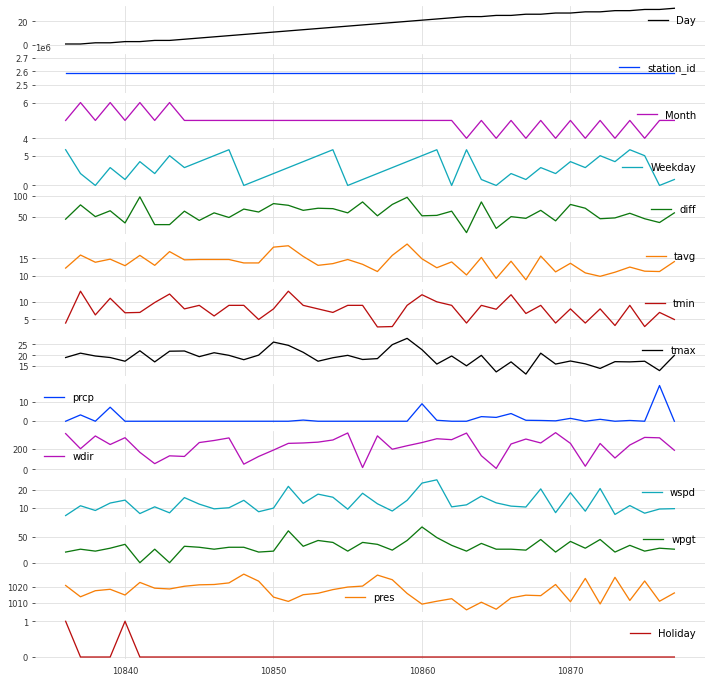

In [ ]:
grouped_df[grouped_df['station_id'] == 2585982].plot(subplots=True, sharex=True, figsize=(12,12))
plt.show()

In [ ]:
from sklearn.preprocessing import OrdinalEncoder

ord_enc = OrdinalEncoder()
grouped_df["station_id"] = ord_enc.fit_transform(grouped_df[["station_id"]])
grouped_df.head(11)

,Day,station_id,Month,Weekday,diff,tavg,tmin,tmax,prcp,wdir,wspd,wpgt,pres,Holiday
0,1,0.0,5,6,20.0,12.2,4.0,19.0,0.0,348.0,5.9,20.4,1020.8,1
1,1,0.0,6,2,22.0,16.0,13.0,21.0,3.3,201.0,11.3,25.9,1013.7,0
2,2,0.0,5,0,14.0,13.9,6.3,19.7,0.0,325.0,8.7,22.2,1017.5,0
3,2,0.0,6,3,26.0,14.8,11.0,19.0,7.3,242.0,12.8,27.8,1018.4,0
4,3,0.0,5,1,20.0,12.9,6.9,17.3,0.0,308.0,14.4,35.2,1014.8,1
5,3,0.0,6,4,41.0,15.9,7.0,22.1,0.0,166.0,7.0,0.0,1022.7,0
6,4,0.0,5,2,15.0,13.0,9.8,17.0,0.0,56.0,10.7,25.9,1019.1,0
7,4,0.0,6,5,14.0,17.0,12.2,21.9,0.0,132.0,7.4,0.0,1018.6,0
8,5,0.0,5,3,26.0,14.6,8.0,22.0,0.0,126.0,15.8,31.5,1020.3,0
9,6,0.0,5,4,17.0,14.7,9.0,19.4,0.0,261.0,12.2,29.6,1021.2,0


In [ ]:
y = grouped_df.pop('diff')

In [ ]:
from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()
df_scaled = pd.DataFrame(scalar.fit_transform(grouped_df), columns=grouped_df.columns)
df_scaled

,Day,station_id,Month,Weekday,tavg,tmin,tmax,prcp,wdir,wspd,wpgt,pres,Holiday
0,-1.578184,-1.727051,0.141128,1.500328,-0.625013,-1.360907,-0.003474,-0.353204,1.271500,-1.397038,-0.797852,0.663624,4.471495
1,-1.578184,-1.727051,2.114496,-0.499791,0.963427,1.915860,0.581407,0.646246,-0.259820,-0.283672,-0.358222,-0.576056,-0.223639
2,-1.476684,-1.727051,0.141128,-1.499851,0.085605,-0.523511,0.201234,-0.353204,1.031906,-0.819737,-0.653973,0.087435,-0.223639
3,-1.476684,-1.727051,2.114496,0.000239,0.461814,1.187690,-0.003474,1.857701,0.167283,0.025596,-0.206349,0.244577,-0.223639
4,-1.375184,-1.727051,0.141128,-0.999821,-0.332406,-0.305060,-0.500623,-0.353204,0.854815,0.355482,0.385154,-0.383993,4.471495
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14649,1.263821,1.727953,-1.832240,0.500269,-1.126626,-1.615767,-0.559112,-0.353204,-1.197363,-1.273331,-0.797852,1.554099,-0.223639
14650,1.263821,1.727953,0.141128,1.500328,-0.499610,0.459519,-0.588356,-0.232058,0.115197,-0.263055,0.233281,-0.977643,-0.223639
14651,1.365321,1.727953,-1.832240,1.000299,-1.001223,-1.724993,-0.500623,-0.353204,0.886066,-1.129006,-0.653973,1.152512,-0.223639
14652,1.365321,1.727953,0.141128,-1.499851,-1.043024,-0.268651,-1.758118,5.280060,0.844397,-0.654794,-0.206349,-1.064944,-0.223639


In [ ]:
from sklearn import decomposition
to_pca_df = df_scaled.drop(['Day', 'Month', 'Holiday','station_id'], axis=1)
pca = decomposition.PCA(n_components=9)
principalComponents = pca.fit_transform(to_pca_df)

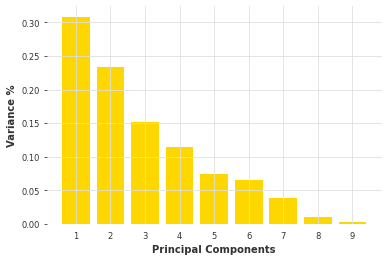

In [ ]:
PC = range(1, pca.n_components_+1)
plt.bar(PC, pca.explained_variance_ratio_, color='gold')
plt.xlabel('Principal Components')
plt.ylabel('Variance %')
plt.xticks(PC)

# Putting components in a dataframe for later
PCA_components = pd.DataFrame(principalComponents)

In [ ]:
PCA_components.head()

,0,1,2,3,4,5,6,7,8
0,-1.966408,0.024702,-2.100365,0.833590,0.306650,0.278259,0.148958,-0.295583,0.095171
1,1.172390,-0.905794,1.394472,0.973801,0.867267,-0.206693,-0.488694,-0.245232,0.175144
2,-1.096808,-0.258499,0.332836,0.945344,-0.903502,-1.326874,-0.089019,0.058381,0.076215
3,0.781025,0.062919,0.906851,1.370528,0.287145,1.111057,-0.738183,0.169623,0.026618
4,0.090036,0.840777,-0.023943,0.029054,-0.876911,-1.093934,-0.159238,0.114167,-0.104679


In [ ]:
PCA_components.drop([7,8], axis=1, inplace=True)
PCA_components.head()

,0,1,2,3,4,5,6
0,-1.966408,0.024702,-2.100365,0.833590,0.306650,0.278259,0.148958
1,1.172390,-0.905794,1.394472,0.973801,0.867267,-0.206693,-0.488694
2,-1.096808,-0.258499,0.332836,0.945344,-0.903502,-1.326874,-0.089019
3,0.781025,0.062919,0.906851,1.370528,0.287145,1.111057,-0.738183
4,0.090036,0.840777,-0.023943,0.029054,-0.876911,-1.093934,-0.159238


In [ ]:
df_scaled.drop(['Weekday', 'tavg', 'tmin', 'tmax', 'prcp', 'wdir', 'wspd', 'wpgt', 'pres'], axis=1, inplace=True)

In [ ]:
df_scaled = df_scaled.join(PCA_components)
df_scaled.head()

,Day,station_id,Month,Holiday,0,1,2,3,4,5,6
0,-1.578184,-1.727051,0.141128,4.471495,-1.966408,0.024702,-2.100365,0.833590,0.306650,0.278259,0.148958
1,-1.578184,-1.727051,2.114496,-0.223639,1.172390,-0.905794,1.394472,0.973801,0.867267,-0.206693,-0.488694
2,-1.476684,-1.727051,0.141128,-0.223639,-1.096808,-0.258499,0.332836,0.945344,-0.903502,-1.326874,-0.089019
3,-1.476684,-1.727051,2.114496,-0.223639,0.781025,0.062919,0.906851,1.370528,0.287145,1.111057,-0.738183
4,-1.375184,-1.727051,0.141128,4.471495,0.090036,0.840777,-0.023943,0.029054,-0.876911,-1.093934,-0.159238


In [ ]:
def df_to_X_y2(df, y, window_size=1):
  df.sort_values(by=['Month', 'Day'], inplace=True)
  df2 = df.drop('Month', axis=1)
  df_as_np = df2.to_numpy()
  y_as_np = y.to_numpy()
  X = []
  y = []
  for i in range(len(df_as_np)-window_size):
    row = [r for r in df_as_np[i:i+window_size]]
    X.append(row)
    label = [r for r in y_as_np[i:i+window_size]]
    y.append(label)
  return np.array(X), np.array(y)

X2, y2 = df_to_X_y2(df_scaled, y)
X2.shape, y2.shape

((14653, 1, 9), (14653, 1))

In [ ]:
unsorted = [df_to_X_y2(df_scaled[df_scaled.station_id == i], y[df_scaled.station_id == i]) for i in df_scaled.station_id.unique()]

In [ ]:
X2, y2 = [], []
for i in range(len(unsorted[0][0])):
  for e in unsorted:
    if len(e[0])>i:
      X2.append(e[0][i])
      y2.append(e[1][i])
len(X2), len(y2)

(14305, 14305)

In [ ]:
X2, y2 = np.array(X2), np.array(y2)

In [ ]:
X2_train, y2_train = X2[:12875], y2[:12875]
X2_val, y2_val = X2[12875:13589], y2[12875:13589]
X2_test, y2_test = X2[13589:], y2[13589:]
X2_train.shape, y2_train.shape, X2_val.shape, y2_val.shape, X2_test.shape, y2_test.shape

((12875, 1, 9), (12875, 1), (714, 1, 9), (714, 1), (716, 1, 9), (716, 1))

In [ ]:
temp_training_mean = np.mean(X2_train[:, :, 0])
temp_training_std = np.std(X2_train[:, :, 0])
                           
def preprocess(X):
  X[:, :, 0] = (X[:, :, 0] - temp_training_mean) / temp_training_std
  return X

In [ ]:
X2_train = preprocess(X2_train)
X2_val = preprocess(X2_val)
X2_test = preprocess(X2_test)

In [ ]:
X2_train.shape, y2_train.shape

((10989, 7, 9), (10989, 7))

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam

model4 = Sequential()
model4.add(LSTM(units=150, return_sequences=True, input_shape=(1,9)))
model4.add(Dropout(0.2))
model4.add(LSTM(units=150, return_sequences=True))
model4.add(Dense(8, activation='tanh'))
model4.add(Dense(4, activation='tanh'))
model4.add(Dropout(0.2))
model4.add(Dense(1, 'linear'))

model4.summary()

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_52 (LSTM)              (None, 1, 150)            96000     
                                                                 
 dropout_36 (Dropout)        (None, 1, 150)            0         
                                                                 
 lstm_53 (LSTM)              (None, 1, 150)            180600    
                                                                 
 dense_54 (Dense)            (None, 1, 8)              1208      
                                                                 
 dense_55 (Dense)            (None, 1, 4)              36        
                                                                 
 dropout_37 (Dropout)        (None, 1, 4)              0         
                                                                 
 dense_56 (Dense)            (None, 1, 1)            

In [ ]:
cp1 = ModelCheckpoint('model1/', save_best_only=True)
model4.compile(loss=MeanSquaredError(), optimizer='rmsprop', metrics=[MeanSquaredError()])

In [ ]:
model4.fit(X2_train, y2_train, validation_data=(X2_val, y2_val), epochs=150, callbacks=[cp1], shuffle=False)

Epoch 1/150
397/403 [============================>.] - ETA: 0s - loss: 984.4802 - mean_squared_error: 984.4802

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 21s 40ms/step - loss: 975.5760 - mean_squared_error: 974.2173 - val_loss: 686.5759 - val_mean_squared_error: 680.5737
Epoch 2/150
399/403 [============================>.] - ETA: 0s - loss: 873.5759 - mean_squared_error: 873.5759

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 13s 33ms/step - loss: 868.0628 - mean_squared_error: 866.8365 - val_loss: 609.6921 - val_mean_squared_error: 603.9486
Epoch 3/150
399/403 [============================>.] - ETA: 0s - loss: 789.3794 - mean_squared_error: 789.3794

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 13s 32ms/step - loss: 784.3109 - mean_squared_error: 783.2108 - val_loss: 541.1470 - val_mean_squared_error: 535.6618
Epoch 4/150
402/403 [============================>.] - ETA: 0s - loss: 709.0370 - mean_squared_error: 709.0370

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 16s 39ms/step - loss: 708.5235 - mean_squared_error: 707.5457 - val_loss: 480.5019 - val_mean_squared_error: 475.2700
Epoch 5/150
399/403 [============================>.] - ETA: 0s - loss: 647.2498 - mean_squared_error: 647.2498

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 13s 32ms/step - loss: 643.0195 - mean_squared_error: 642.1401 - val_loss: 427.6688 - val_mean_squared_error: 422.6835
Epoch 6/150
403/403 [==============================] - ETA: 0s - loss: 584.1773 - mean_squared_error: 583.4102

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 15s 36ms/step - loss: 584.1773 - mean_squared_error: 583.4102 - val_loss: 382.4613 - val_mean_squared_error: 377.7143
Epoch 7/150
401/403 [============================>.] - ETA: 0s - loss: 533.6180 - mean_squared_error: 533.6180

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 13s 32ms/step - loss: 532.4190 - mean_squared_error: 531.7594 - val_loss: 344.7128 - val_mean_squared_error: 340.1929
Epoch 8/150
400/403 [============================>.] - ETA: 0s - loss: 492.7166 - mean_squared_error: 492.7166

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 14s 36ms/step - loss: 493.2078 - mean_squared_error: 493.3227 - val_loss: 314.2732 - val_mean_squared_error: 309.9646
Epoch 9/150
403/403 [==============================] - ETA: 0s - loss: 457.6446 - mean_squared_error: 457.2152

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 14s 35ms/step - loss: 457.6446 - mean_squared_error: 457.2152 - val_loss: 290.1750 - val_mean_squared_error: 286.0614
Epoch 10/150
397/403 [============================>.] - ETA: 0s - loss: 433.8033 - mean_squared_error: 433.8033

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 14s 36ms/step - loss: 429.9758 - mean_squared_error: 429.4598 - val_loss: 270.2218 - val_mean_squared_error: 266.3201
Epoch 11/150
403/403 [==============================] - ETA: 0s - loss: 412.0179 - mean_squared_error: 411.7072

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 13s 33ms/step - loss: 412.0179 - mean_squared_error: 411.7072 - val_loss: 256.9773 - val_mean_squared_error: 253.2098
Epoch 12/150
398/403 [============================>.] - ETA: 0s - loss: 393.2267 - mean_squared_error: 393.2267

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 15s 37ms/step - loss: 393.0788 - mean_squared_error: 392.7072 - val_loss: 243.0218 - val_mean_squared_error: 239.5063
Epoch 13/150
403/403 [==============================] - ETA: 0s - loss: 379.2219 - mean_squared_error: 378.8704

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 13s 33ms/step - loss: 379.2219 - mean_squared_error: 378.8704 - val_loss: 239.2983 - val_mean_squared_error: 235.8024
Epoch 14/150
400/403 [============================>.] - ETA: 0s - loss: 369.9074 - mean_squared_error: 369.9074

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 15s 36ms/step - loss: 369.3872 - mean_squared_error: 369.2073 - val_loss: 234.2689 - val_mean_squared_error: 230.8813
Epoch 15/150
400/403 [============================>.] - ETA: 0s - loss: 356.7331 - mean_squared_error: 356.7331

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 13s 33ms/step - loss: 356.3180 - mean_squared_error: 356.1999 - val_loss: 229.1517 - val_mean_squared_error: 225.9107
Epoch 16/150
403/403 [==============================] - ETA: 0s - loss: 350.4885 - mean_squared_error: 350.2988

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 13s 32ms/step - loss: 350.4885 - mean_squared_error: 350.2988 - val_loss: 221.1016 - val_mean_squared_error: 218.1200
Epoch 17/150
401/403 [============================>.] - ETA: 0s - loss: 348.4599 - mean_squared_error: 348.4599

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 14s 35ms/step - loss: 347.9087 - mean_squared_error: 347.7007 - val_loss: 218.8757 - val_mean_squared_error: 215.9960
Epoch 18/150
402/403 [============================>.] - ETA: 0s - loss: 341.0556 - mean_squared_error: 341.0556

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 12s 31ms/step - loss: 340.8789 - mean_squared_error: 340.5423 - val_loss: 218.5761 - val_mean_squared_error: 215.7535
Epoch 19/150
399/403 [============================>.] - ETA: 0s - loss: 341.8941 - mean_squared_error: 341.8941

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 14s 34ms/step - loss: 340.0558 - mean_squared_error: 339.8246 - val_loss: 216.7783 - val_mean_squared_error: 214.0662
Epoch 20/150
399/403 [============================>.] - ETA: 0s - loss: 337.2467 - mean_squared_error: 337.2467

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 13s 31ms/step - loss: 335.4749 - mean_squared_error: 335.1773 - val_loss: 216.2120 - val_mean_squared_error: 213.5808
Epoch 21/150
399/403 [============================>.] - ETA: 0s - loss: 327.2501 - mean_squared_error: 327.2501

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 14s 34ms/step - loss: 325.5074 - mean_squared_error: 325.2628 - val_loss: 216.0918 - val_mean_squared_error: 213.5330
Epoch 22/150
403/403 [==============================] - 3s 7ms/step - loss: 326.7654 - mean_squared_error: 326.6389 - val_loss: 217.9549 - val_mean_squared_error: 215.4041
Epoch 23/150
398/403 [============================>.] - ETA: 0s - loss: 327.1518 - mean_squared_error: 327.1518

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 12s 31ms/step - loss: 325.1403 - mean_squared_error: 324.9100 - val_loss: 216.0705 - val_mean_squared_error: 213.4575
Epoch 24/150
396/403 [============================>.] - ETA: 0s - loss: 324.1483 - mean_squared_error: 324.1483

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 14s 34ms/step - loss: 321.4240 - mean_squared_error: 321.1046 - val_loss: 205.4343 - val_mean_squared_error: 203.8118
Epoch 25/150
398/403 [============================>.] - ETA: 0s - loss: 319.5957 - mean_squared_error: 319.5957

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 13s 31ms/step - loss: 317.6694 - mean_squared_error: 317.3470 - val_loss: 200.2178 - val_mean_squared_error: 202.2519
Epoch 26/150
399/403 [============================>.] - ETA: 0s - loss: 312.2807 - mean_squared_error: 312.2807

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 12s 31ms/step - loss: 310.8177 - mean_squared_error: 310.5246 - val_loss: 191.0921 - val_mean_squared_error: 189.0335
Epoch 27/150
403/403 [==============================] - 3s 8ms/step - loss: 307.8294 - mean_squared_error: 307.6169 - val_loss: 203.2135 - val_mean_squared_error: 200.7824
Epoch 28/150
403/403 [==============================] - 3s 8ms/step - loss: 306.4350 - mean_squared_error: 306.1218 - val_loss: 193.0766 - val_mean_squared_error: 190.9471
Epoch 29/150
403/403 [==============================] - 3s 8ms/step - loss: 302.0411 - mean_squared_error: 301.8041 - val_loss: 201.8018 - val_mean_squared_error: 199.5725
Epoch 30/150
403/403 [==============================] - 3s 8ms/step - loss: 299.4821 - mean_squared_error: 299.1780 - val_loss: 201.3034 - val_mean_squared_error: 198.9792
Epoch 31/150
403/403 [==============================] - 3s 8ms/step - loss: 295.9834 - mean_squared_error: 295.6919 - val_loss: 193.3542 - val_mean_squ

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 15s 36ms/step - loss: 295.3140 - mean_squared_error: 295.0672 - val_loss: 187.4544 - val_mean_squared_error: 185.5357
Epoch 33/150
403/403 [==============================] - 3s 8ms/step - loss: 292.0788 - mean_squared_error: 291.8114 - val_loss: 209.6398 - val_mean_squared_error: 207.1431
Epoch 34/150
403/403 [==============================] - 3s 8ms/step - loss: 291.0765 - mean_squared_error: 290.8181 - val_loss: 195.1984 - val_mean_squared_error: 193.0956
Epoch 35/150
403/403 [==============================] - 3s 8ms/step - loss: 290.6135 - mean_squared_error: 290.3875 - val_loss: 195.1334 - val_mean_squared_error: 193.0404
Epoch 36/150
403/403 [==============================] - 3s 8ms/step - loss: 287.2248 - mean_squared_error: 286.9778 - val_loss: 229.3866 - val_mean_squared_error: 226.2112
Epoch 37/150
403/403 [==============================] - 3s 8ms/step - loss: 284.3916 - mean_squared_error: 284.1856 - val_loss: 221.5363 - val_mean_squ

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 13s 33ms/step - loss: 281.7068 - mean_squared_error: 281.4271 - val_loss: 182.3182 - val_mean_squared_error: 180.5269
Epoch 41/150
403/403 [==============================] - 3s 8ms/step - loss: 279.1725 - mean_squared_error: 278.9289 - val_loss: 182.9559 - val_mean_squared_error: 181.1074
Epoch 42/150
399/403 [============================>.] - ETA: 0s - loss: 278.7931 - mean_squared_error: 278.7931

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 15s 37ms/step - loss: 277.6684 - mean_squared_error: 277.4439 - val_loss: 178.8636 - val_mean_squared_error: 177.1925
Epoch 43/150
399/403 [============================>.] - ETA: 0s - loss: 277.7189 - mean_squared_error: 277.7189

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 14s 34ms/step - loss: 276.4787 - mean_squared_error: 276.1893 - val_loss: 174.3299 - val_mean_squared_error: 172.8693
Epoch 44/150
398/403 [============================>.] - ETA: 0s - loss: 276.3600 - mean_squared_error: 276.3600

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 15s 38ms/step - loss: 274.8317 - mean_squared_error: 274.5903 - val_loss: 170.8860 - val_mean_squared_error: 169.5511
Epoch 45/150
402/403 [============================>.] - ETA: 0s - loss: 275.3872 - mean_squared_error: 275.3872

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 14s 35ms/step - loss: 275.2420 - mean_squared_error: 274.9655 - val_loss: 170.4700 - val_mean_squared_error: 169.1199
Epoch 46/150
403/403 [==============================] - 4s 9ms/step - loss: 273.0035 - mean_squared_error: 272.7643 - val_loss: 170.5455 - val_mean_squared_error: 169.2698
Epoch 47/150
403/403 [==============================] - 4s 9ms/step - loss: 272.3611 - mean_squared_error: 272.0768 - val_loss: 171.6725 - val_mean_squared_error: 170.2815
Epoch 48/150
403/403 [==============================] - ETA: 0s - loss: 269.1264 - mean_squared_error: 268.8702

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 15s 37ms/step - loss: 269.1264 - mean_squared_error: 268.8702 - val_loss: 168.5011 - val_mean_squared_error: 167.1924
Epoch 49/150
403/403 [==============================] - 3s 8ms/step - loss: 267.5318 - mean_squared_error: 267.2714 - val_loss: 168.7142 - val_mean_squared_error: 167.3731
Epoch 50/150
403/403 [==============================] - 3s 8ms/step - loss: 266.6068 - mean_squared_error: 266.3516 - val_loss: 170.2175 - val_mean_squared_error: 168.8637
Epoch 51/150
403/403 [==============================] - 3s 8ms/step - loss: 266.2808 - mean_squared_error: 266.0392 - val_loss: 169.9256 - val_mean_squared_error: 168.5711
Epoch 52/150
403/403 [==============================] - 3s 8ms/step - loss: 264.2290 - mean_squared_error: 263.9700 - val_loss: 171.0501 - val_mean_squared_error: 169.6383
Epoch 53/150
403/403 [==============================] - 4s 9ms/step - loss: 265.5598 - mean_squared_error: 265.3141 - val_loss: 170.1340 - val_mean_squ

INFO:tensorflow:Assets written to: model1/assets


INFO:tensorflow:Assets written to: model1/assets


403/403 [==============================] - 13s 33ms/step - loss: 249.6719 - mean_squared_error: 249.4219 - val_loss: 168.0065 - val_mean_squared_error: 167.0642
Epoch 65/150
403/403 [==============================] - 3s 8ms/step - loss: 251.5068 - mean_squared_error: 251.3080 - val_loss: 169.9022 - val_mean_squared_error: 168.8225
Epoch 66/150
403/403 [==============================] - 3s 8ms/step - loss: 253.7654 - mean_squared_error: 253.5483 - val_loss: 173.3599 - val_mean_squared_error: 172.1151
Epoch 67/150
403/403 [==============================] - 3s 8ms/step - loss: 252.0588 - mean_squared_error: 251.9010 - val_loss: 178.0134 - val_mean_squared_error: 176.4044
Epoch 68/150
403/403 [==============================] - 3s 8ms/step - loss: 250.9416 - mean_squared_error: 250.7473 - val_loss: 177.8677 - val_mean_squared_error: 176.2589
Epoch 69/150
403/403 [==============================] - 3s 8ms/step - loss: 249.1360 - mean_squared_error: 248.9090 - val_loss: 172.7261 - val_mean_squ

KeyboardInterrupt: ignored

,Predictions,Actuals
0,17.454056,3.0
1,17.410488,87.0
2,17.367119,5.0
3,17.323948,135.0
4,17.280987,39.0
...,...,...
95,25.988775,33.0
96,26.058584,26.0
97,26.125587,38.0
98,26.189377,16.0


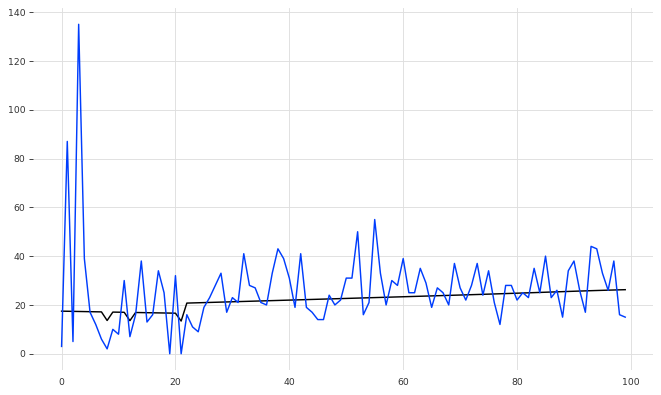

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(10, 6), dpi=80)

def plot_predictions2(model, X, y, start=0, end=100):
  predictions = model.predict(X).flatten()
  df = pd.DataFrame(data={'Predictions': predictions,
                          'Actuals':y.flatten()
                          })
  plt.plot(df['Predictions'][start:end])
  plt.plot(df['Actuals'][start:end])
  return df[start:end]
plot_predictions2(model4, X2_test, y2_test)

In [ ]:
X2_test.shape, y2_test.shape

((611, 7, 9), (611,))

In [ ]:
import tensorflow as tf

lstm_model = tf.keras.models.Sequential([
   tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(200, return_sequences=True), 
                                input_shape=X2_train.shape[-2:]),
     tf.keras.layers.Dense(20, activation='tanh'),
     tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(150)),
     tf.keras.layers.Dense(20, activation='tanh'),
     tf.keras.layers.Dense(20, activation='tanh'),
     tf.keras.layers.Dropout(0.2),
     tf.keras.layers.Dense(1, 'linear'),
 ])

In [ ]:
cp1 = ModelCheckpoint('model2/', save_best_only=True)
lstm_model.compile(loss=MeanSquaredError(), optimizer='adam', metrics=[MeanSquaredError()])
# fit
history1=lstm_model.fit(X2_train,y2_train,validation_data=(X2_val,y2_val),
        callbacks=[cp1],verbose=1,epochs=150)

403/403 [==============================] - 5s 13ms/step - loss: 224.1926 - mean_squared_error: 223.9746 - val_loss: 207.3560 - val_mean_squared_error: 204.9513
Epoch 47/150
316/403 [======================>.......] - ETA: 0s - loss: 218.4462 - mean_squared_error: 218.4462

KeyboardInterrupt: ignored

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(10, 6), dpi=80)

def plot_predictions2(model, X, y, start=0, end=100):
  predictions = model.predict(X).flatten()
  df = pd.DataFrame(data={'Predictions': predictions,
                          'Actuals':y
                          })
  plt.plot(df['Predictions'][start:end])
  plt.plot(df['Actuals'][start:end])
  return df[start:end]
plot_predictions2(model4, X2_train, y2_train)

ValueError: ignored

<Figure size 800x480 with 0 Axes>

In [ ]:
import xgboost as xgb
import numpy as np
from sklearn.decomposition import PCA
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [ ]:
y = grouped_df.pop('diff')

KeyError: ignored

In [ ]:
pca_df = grouped_df.drop('Time', axis=1)

In [ ]:
from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()
df_scaled = pd.DataFrame(scalar.fit_transform(pca_df), columns=pca_df.columns)
df_scaled

,Day,station_id,Month,Weekday,tavg,tmin,tmax,prcp,wdir,wspd,wpgt,pres
0,-1.578184,-0.524922,0.141128,1.500328,-0.625013,-1.360907,-0.003474,-0.353204,1.271500,-1.397038,-0.797852,0.663624
1,-1.578184,-0.524922,2.114496,-0.499791,0.963427,1.915860,0.581407,0.646246,-0.259820,-0.283672,-0.358222,-0.576056
2,-1.476684,-0.524922,0.141128,-1.499851,0.085605,-0.523511,0.201234,-0.353204,1.031906,-0.819737,-0.653973,0.087435
3,-1.476684,-0.524922,2.114496,0.000239,0.461814,1.187690,-0.003474,1.857701,0.167283,0.025596,-0.206349,0.244577
4,-1.375184,-0.524922,0.141128,-0.999821,-0.332406,-0.305060,-0.500623,-0.353204,0.854815,0.355482,0.385154,-0.383993
...,...,...,...,...,...,...,...,...,...,...,...,...
14649,1.263821,8.093318,-1.832240,0.500269,-1.126626,-1.615767,-0.559112,-0.353204,-1.197363,-1.273331,-0.797852,1.554099
14650,1.263821,8.093318,0.141128,1.500328,-0.499610,0.459519,-0.588356,-0.232058,0.115197,-0.263055,0.233281,-0.977643
14651,1.365321,8.093318,-1.832240,1.000299,-1.001223,-1.724993,-0.500623,-0.353204,0.886066,-1.129006,-0.653973,1.152512
14652,1.365321,8.093318,0.141128,-1.499851,-1.043024,-0.268651,-1.758118,5.280060,0.844397,-0.654794,-0.206349,-1.064944


In [ ]:
# initializing the pca
from sklearn import decomposition
pca = decomposition.PCA(n_components=12)
principalComponents = pca.fit_transform(df_scaled)

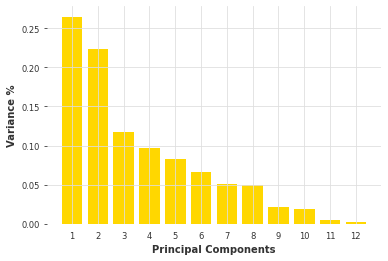

In [ ]:
PC = range(1, pca.n_components_+1)
plt.bar(PC, pca.explained_variance_ratio_, color='gold')
plt.xlabel('Principal Components')
plt.ylabel('Variance %')
plt.xticks(PC)

# Putting components in a dataframe for later
PCA_components = pd.DataFrame(principalComponents)

In [ ]:
pca_train_df = PCA_components.drop([8, 9, 10, 11], axis=1)

In [ ]:
pca_train_df.head()

,0,1,2,3,4,5,6,7
0,-0.741510,-1.936449,-1.562431,1.838532,-0.525813,-0.787869,0.317828,0.240559
1,2.902340,-0.551234,1.663885,0.924964,-0.535420,-0.673607,-0.394784,0.175816
2,0.021429,-1.477585,0.509369,0.793989,-0.530574,0.554052,-0.306470,1.796131
3,2.133067,-0.260809,1.544097,1.763350,-0.537096,-0.736422,1.073275,-0.161577
4,0.076555,0.112381,0.204616,0.419851,-0.531900,-0.252180,0.101861,1.936059


In [ ]:
df_scaled.head()

,Day,station_id,Month,Holiday,0,1,2,3,4,5,6
0,-1.578184,-1.727051,0.141128,4.471495,-1.966408,0.024702,-2.100365,0.833590,0.306650,0.278259,0.148958
1,-1.578184,-1.727051,2.114496,-0.223639,1.172390,-0.905794,1.394472,0.973801,0.867267,-0.206693,-0.488694
2,-1.476684,-1.727051,0.141128,-0.223639,-1.096808,-0.258499,0.332836,0.945344,-0.903502,-1.326874,-0.089019
3,-1.476684,-1.727051,2.114496,-0.223639,0.781025,0.062919,0.906851,1.370528,0.287145,1.111057,-0.738183
4,-1.375184,-1.727051,0.141128,4.471495,0.090036,0.840777,-0.023943,0.029054,-0.876911,-1.093934,-0.159238


In [ ]:
y

0        20.0
1        22.0
2        14.0
3        26.0
4        20.0
         ... 
14649     1.0
14650     3.0
14651     0.0
14652     5.0
14653     8.0
Name: diff, Length: 14654, dtype: float64

In [ ]:
X_test = df_scaled.loc[((grouped_df['Month'] == 5) & (grouped_df['Day'] > 28)) | (grouped_df['Month'] == 6)].copy()
X_train = df_scaled.loc[((grouped_df['Month'] == 5) & (grouped_df['Day'] <= 28)) | (grouped_df['Month'] <5) ].copy()

In [ ]:
y_test = y.loc[((grouped_df['Month'] == 5) & (grouped_df['Day'] > 28)) | (grouped_df['Month'] == 6)].copy()
y_train = y.loc[((grouped_df['Month'] == 5) & (grouped_df['Day'] <= 28)) | (grouped_df['Month'] <5) ].copy()

In [ ]:
len(data_train), len(data_test)

(12212, 2442)

In [ ]:
def create_features(df, label='diff'):
    X=df[['Day', 'station_id', 'Weekday', 'tavg', 'tmin', 'tmax', 'prcp', 'wdir', 'wspd', 'wpgt', 'pres']]
    if label:
        y = df[label]
        return X, y
    return X

In [ ]:
sorted(sklearn.metrics.SCORERS.keys())

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'max_error',
 'mutual_info_score',
 'neg_brier_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_absolute_percentage_error',
 'neg_mean_gamma_deviance',
 'neg_mean_poisson_deviance',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'neg_root_mean_squared_error',
 'normalized_mutual_info_score',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'rand_score',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',
 'roc_auc',
 'roc_auc_ovo',
 'roc_auc_ovo_weighted',
 'roc_auc_ovr',
 'roc_auc_ovr_we

In [ ]:
X_train, y_train = create_features(data_train)
X_test, y_test = create_features(data_test)
X_train

,Day,station_id,Weekday,tavg,tmin,tmax,prcp,wdir,wspd,wpgt,pres
0,1,448565,6,12.2,4.0,19.0,0.0,348.0,5.9,20.4,1020.8
2,2,448565,0,13.9,6.3,19.7,0.0,325.0,8.7,22.2,1017.5
4,3,448565,1,12.9,6.9,17.3,0.0,308.0,14.4,35.2,1014.8
6,4,448565,2,13.0,9.8,17.0,0.0,56.0,10.7,25.9,1019.1
8,5,448565,3,14.6,8.0,22.0,0.0,126.0,15.8,31.5,1020.3
...,...,...,...,...,...,...,...,...,...,...,...
14646,27,55316960,4,13.6,8.0,17.4,1.5,253.0,18.5,40.8,1010.6
14647,28,55316960,3,10.8,4.0,16.1,0.0,31.0,8.3,27.8,1025.2
14648,28,55316960,5,9.8,8.0,14.0,1.0,252.0,20.8,44.5,1009.2
14649,29,55316960,4,11.0,3.3,17.1,0.0,111.0,6.5,20.4,1025.9


In [ ]:
X_train.drop('Month', axis=1, inplace=True)
X_test.drop('Month', axis=1, inplace=True)

In [ ]:
reg = xgb.XGBRegressor(learning_rate= 0.1, subsample= 0.9, max_depth=8,objective='reg:squarederror', n_estimators=10000, colsample_bytree=1)

In [ ]:
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=2000,
       verbose=True)

[0]	validation_0-rmse:30.1408	validation_1-rmse:33.5033
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 2000 rounds.
[1]	validation_0-rmse:27.6503	validation_1-rmse:31.4845
[2]	validation_0-rmse:25.4628	validation_1-rmse:29.5723
[3]	validation_0-rmse:23.5037	validation_1-rmse:27.8669
[4]	validation_0-rmse:21.7599	validation_1-rmse:26.422
[5]	validation_0-rmse:20.239	validation_1-rmse:25.1282
[6]	validation_0-rmse:18.9121	validation_1-rmse:24.0135
[7]	validation_0-rmse:17.7601	validation_1-rmse:22.9804
[8]	validation_0-rmse:16.7523	validation_1-rmse:22.1049
[9]	validation_0-rmse:15.9034	validation_1-rmse:21.2168
[10]	validation_0-rmse:15.134	validation_1-rmse:20.5925
[11]	validation_0-rmse:14.4217	validation_1-rmse:19.9252
[12]	validation_0-rmse:13.854	validation_1-rmse:19.3319
[13]	validation_0-rmse:13.3675	validation_1-rmse:18.9126
[14]	validation_0-rmse:12.9659	validation_1-rmse:18.406

XGBRegressor(max_depth=8, n_estimators=10000, objective='reg:squarederror',
             subsample=0.9)

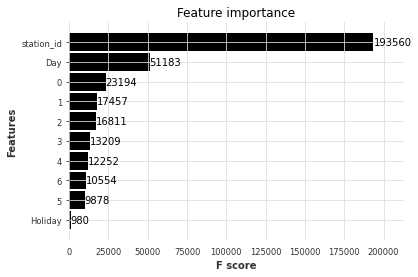

In [ ]:
_ = plot_importance(reg, height=0.9)

In [ ]:
data_all = pd.DataFrame({'predictions': reg.predict(X_test), 'true': y_test})

In [ ]:
data_all

,predictions,true
1,15.031580,22.0
3,15.861660,26.0
5,18.206659,41.0
7,16.232853,14.0
38,15.064161,18.0
...,...,...
14618,4.918637,7.0
14620,5.240832,0.0
14650,4.597444,3.0
14652,0.800433,5.0


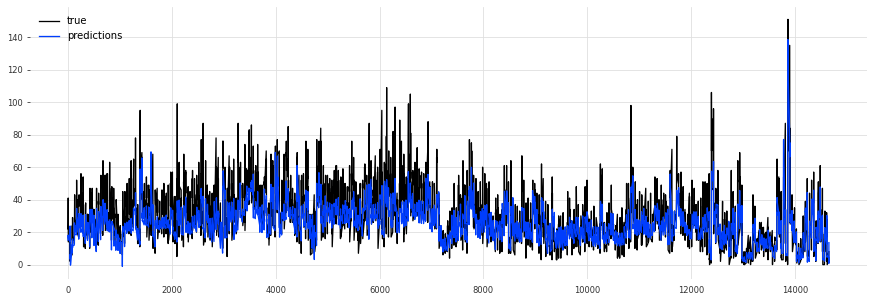

In [ ]:
_ = data_all[['true','predictions']].plot(figsize=(15, 5))

In [ ]:
data_diff = pd.DataFrame({'differences': reg.predict(X_test)-y_test})

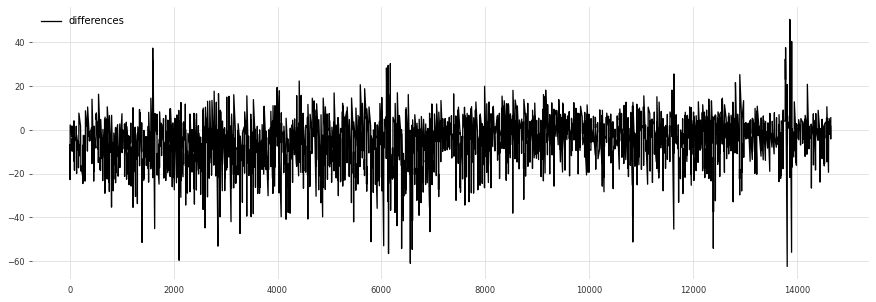

In [ ]:
_ = data_diff[['differences']].plot(figsize=(15, 5))

## 2. This whole statistics business thing

In [ ]:
grouped_df = pd.merge(grouped_df, stations, left_on='station_id', right_on='uid')
grouped_df.head()

,date,station_id,bike_number,Day,Month,Weekday,uid,lat,lng,name,bike_racks
0,2022-04-24 15:44,448565,3,24,4,6,448565,52.183992,21.00984,Nestle House,15
1,2022-04-24 15:51,448565,4,24,4,6,448565,52.183992,21.00984,Nestle House,15
2,2022-04-24 16:21,448565,1,24,4,6,448565,52.183992,21.00984,Nestle House,15
3,2022-04-24 16:51,448565,5,24,4,6,448565,52.183992,21.00984,Nestle House,15
4,2022-04-24 17:21,448565,7,24,4,6,448565,52.183992,21.00984,Nestle House,15


In [ ]:
grouped_df["overflowing"] = [d["bike_number"] / d["bike_racks"] for k,d in grouped_df.iterrows()]
grouped_df["overflowing"] = grouped_df["overflowing"].astype(float)
grouped_df.head()

,date,station_id,bike_number,Day,Month,Weekday,uid,lat,lng,name,bike_racks,overflowing
0,2022-04-24 15:44,448565,3,24,4,6,448565,52.183992,21.00984,Nestle House,15,0.200000
1,2022-04-24 15:51,448565,4,24,4,6,448565,52.183992,21.00984,Nestle House,15,0.266667
2,2022-04-24 16:21,448565,1,24,4,6,448565,52.183992,21.00984,Nestle House,15,0.066667
3,2022-04-24 16:51,448565,5,24,4,6,448565,52.183992,21.00984,Nestle House,15,0.333333
4,2022-04-24 17:21,448565,7,24,4,6,448565,52.183992,21.00984,Nestle House,15,0.466667


In [ ]:
grouped_df[grouped_df["bike_number"] - grouped_df["bike_racks"]>5]

,date,station_id,bike_number,Day,Month,Weekday,uid,lat,lng,name,bike_racks,overflowing
1678,2022-05-16 06:44,448565,21,16,5,0,448565,52.183992,21.009840,Nestle House,15,True
1679,2022-05-16 06:54,448565,21,16,5,0,448565,52.183992,21.009840,Nestle House,15,True
1680,2022-05-16 07:04,448565,22,16,5,0,448565,52.183992,21.009840,Nestle House,15,True
1681,2022-05-16 07:14,448565,22,16,5,0,448565,52.183992,21.009840,Nestle House,15,True
1682,2022-05-16 07:24,448565,21,16,5,0,448565,52.183992,21.009840,Nestle House,15,True
...,...,...,...,...,...,...,...,...,...,...,...,...
1541221,2022-05-30 02:54,2585781,24,30,5,0,2585781,52.198639,20.965252,Grójecka - PKP Rakowiec,18,True
1541222,2022-05-30 03:04,2585781,24,30,5,0,2585781,52.198639,20.965252,Grójecka - PKP Rakowiec,18,True
1541223,2022-05-30 03:14,2585781,24,30,5,0,2585781,52.198639,20.965252,Grójecka - PKP Rakowiec,18,True
1541224,2022-05-30 03:24,2585781,24,30,5,0,2585781,52.198639,20.965252,Grójecka - PKP Rakowiec,18,True


In [ ]:
grouped_df[grouped_df["bike_number"] - grouped_df["bike_racks"]>10]

,date,station_id,bike_number,Day,Month,Weekday,uid,lat,lng,name,bike_racks,overflowing
25255,2022-06-03 19:34,2585265,41,3,6,4,2585265,52.290173,20.950370,Marymoncka - Dewajtis,30,True
25256,2022-06-03 19:44,2585265,41,3,6,4,2585265,52.290173,20.950370,Marymoncka - Dewajtis,30,True
25257,2022-06-03 19:54,2585265,41,3,6,4,2585265,52.290173,20.950370,Marymoncka - Dewajtis,30,True
25258,2022-06-03 20:04,2585265,41,3,6,4,2585265,52.290173,20.950370,Marymoncka - Dewajtis,30,True
25259,2022-06-03 20:14,2585265,41,3,6,4,2585265,52.290173,20.950370,Marymoncka - Dewajtis,30,True
...,...,...,...,...,...,...,...,...,...,...,...,...
1535827,2022-05-23 15:24,2585776,38,23,5,0,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True
1535828,2022-05-23 15:34,2585776,37,23,5,0,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True
1535829,2022-05-23 15:44,2585776,40,23,5,0,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True
1535830,2022-05-23 15:54,2585776,40,23,5,0,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True


In [ ]:
grouped_df[grouped_df["bike_number"] - grouped_df["bike_racks"]>15]

,date,station_id,bike_number,Day,Month,Weekday,uid,lat,lng,name,bike_racks,overflowing
27790,2022-05-20 20:24,2585267,36,20,5,4,2585267,52.285914,20.940561,Metro Wawrzyszew,20,True
27791,2022-05-20 20:34,2585267,36,20,5,4,2585267,52.285914,20.940561,Metro Wawrzyszew,20,True
27792,2022-05-20 20:44,2585267,37,20,5,4,2585267,52.285914,20.940561,Metro Wawrzyszew,20,True
27793,2022-05-20 20:54,2585267,37,20,5,4,2585267,52.285914,20.940561,Metro Wawrzyszew,20,True
27794,2022-05-20 21:04,2585267,37,20,5,4,2585267,52.285914,20.940561,Metro Wawrzyszew,20,True
...,...,...,...,...,...,...,...,...,...,...,...,...
1534610,2022-05-14 15:54,2585776,42,14,5,5,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True
1534611,2022-05-14 16:04,2585776,43,14,5,5,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True
1534612,2022-05-14 16:14,2585776,48,14,5,5,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True
1534613,2022-05-14 16:24,2585776,47,14,5,5,2585776,52.209916,21.006779,al. Niepodległości - Batorego,26,True


Plot stations on a map and add how much of a given day (on average) were they overflowing

In [ ]:
to_plot_df = grouped_df.groupby(['station_id', 'lat', 'lng', 'name'])['overflowing'].mean().reset_index()
to_plot_df.head()

,station_id,lat,lng,name,overflowing
0,448565,52.183992,21.009840,Nestle House,0.481901
1,448566,52.177909,20.997491,New City,0.346049
2,1154451,52.230327,20.982705,Proximo,0.248134
3,2585259,52.296298,20.958358,Dewajtis - UKSW,0.503200
4,2585263,52.290974,20.929556,Metro Młociny,0.517924


In [ ]:
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame

station = [Point(xy) for xy in zip(to_plot_df['lng'], to_plot_df['lat'])]
gdf = GeoDataFrame(to_plot_df, geometry=geometry)   

#this is a simple map that goes with geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15);

In [ ]:
! pip install osmnx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 95 kB 3.0 MB/s 
     |████████████████████████████████| 63 kB 2.0 MB/s 
     |████████████████████████████████| 6.3 MB 30.9 MB/s 
     |████████████████████████████████| 1.0 MB 52.5 MB/s 
     |████████████████████████████████| 1.0 MB 19.9 MB/s 
     |████████████████████████████████| 16.7 MB 49.2 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires ipython~=5.5.0, but you have ipython 7.34.0 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requir

In [ ]:
import osmnx as ox
from matplotlib.pyplot import figure

figure(figsize=(8, 6), dpi=80)
cities = [
"Warsaw, Poland"
]
sf = ox.graph_from_place(cities, network_type='drive')

<Figure size 640x480 with 0 Axes>

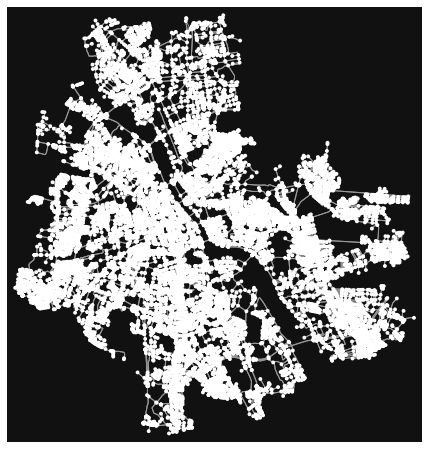

In [ ]:
fig, ax = ox.plot_graph(sf)

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point, Polygon

geometry_t = [Point(xy) for xy in zip(to_plot_df["lng"],to_plot_df["lat"])]
geo_df_t = gpd.GeoDataFrame(to_plot_df, geometry=geometry_t)

In [ ]:
! pip install momepy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 243 kB 2.4 MB/s 
     |████████████████████████████████| 2.4 MB 63.2 MB/s 
     |████████████████████████████████| 2.1 MB 21.6 MB/s 


In [ ]:
import momepy
nodes, edges, sw = momepy.nx_to_gdf(sf, points=True, lines=True,
                                    spatial_weights=True)

In [ ]:
!pip install folium matplotlib mapclassify

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
geo_df_t["x"] = geo_df_t["lng"]
geo_df_t["y"] = geo_df_t["lat"]

In [ ]:
geo_df_t.head()

,station_id,lat,lng,name,overflowing,geometry,x,y
0,448565,52.183992,21.009840,Nestle House,0.481901,POINT (21.00984 52.18399),21.009840,52.183992
1,448566,52.177909,20.997491,New City,0.346049,POINT (20.99749 52.17791),20.997491,52.177909
2,1154451,52.230327,20.982705,Proximo,0.248134,POINT (20.98270 52.23033),20.982705,52.230327
3,2585259,52.296298,20.958358,Dewajtis - UKSW,0.503200,POINT (20.95836 52.29630),20.958358,52.296298
4,2585263,52.290974,20.929556,Metro Młociny,0.517924,POINT (20.92956 52.29097),20.929556,52.290974


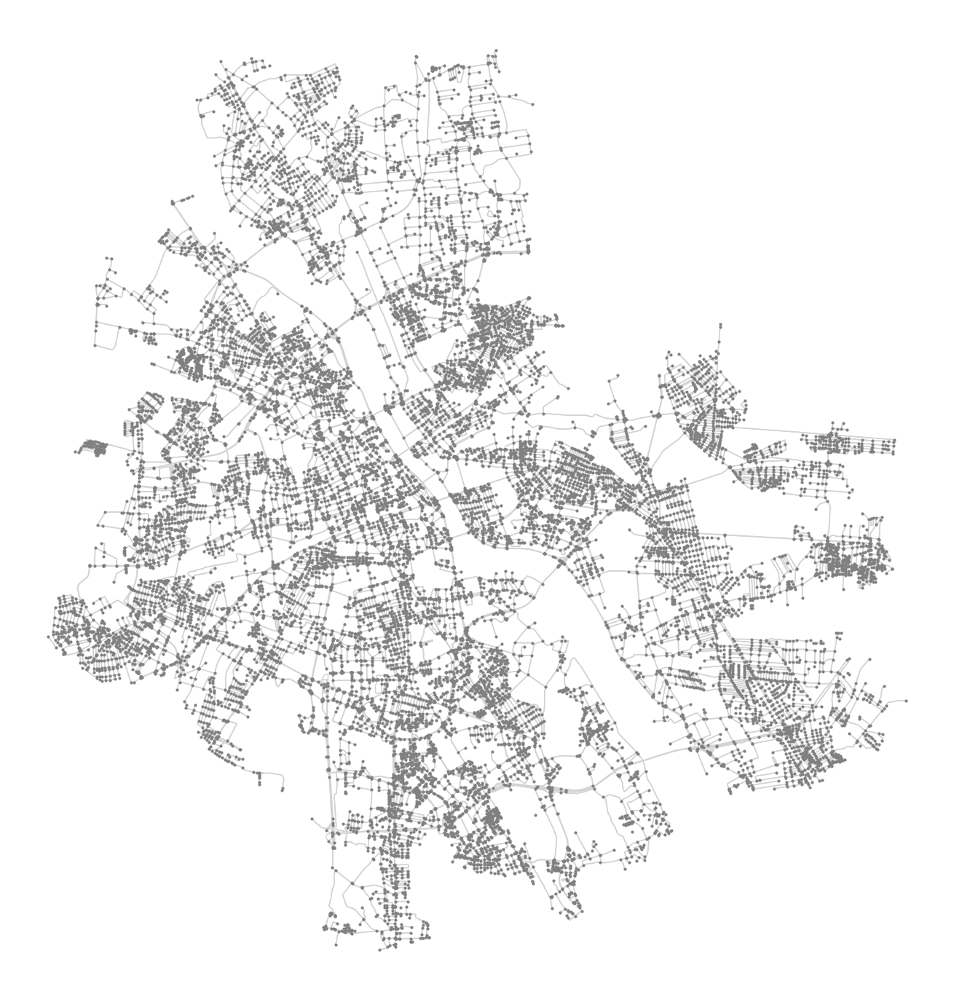

In [ ]:
f, ax = plt.subplots(figsize=(25, 25))
nodes.plot(ax=ax, markersize = 10, color='gray', zorder=2)
edges.plot(ax=ax, color='lightgrey', zorder=1)
geo_df_t.explore('name', color='red', legend=True)
ax.set_axis_off()
plt.show()

In [ ]:
import folium
m = geo_df_t.explore()
folium.TileLayer('Stamen Toner', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)

In [ ]:
nodes.head()

,y,x,street_count,nodeID,highway,ref,geometry
0,52.152787,21.017454,5,0,NaN,NaN,POINT (21.01745 52.15279)
1,52.157570,20.991392,4,1,NaN,NaN,POINT (20.99139 52.15757)
2,52.166411,20.992301,3,2,NaN,NaN,POINT (20.99230 52.16641)
3,52.170803,20.992247,3,3,NaN,NaN,POINT (20.99225 52.17080)
4,52.176009,20.995157,3,4,NaN,NaN,POINT (20.99516 52.17601)


In [ ]:
import folium


addon = {"radius":0.000001, "fill":False}
m = nodes.explore( color='lightgrey',marker_kwds=addon, style_kwds={"fill":False}, tooltip=False)
geo_df_t.explore(column="overflowing",m=m, cmap='hot', marker_kwds={"radius":5, "fill":True},tooltip=["name", "overflowing"])
folium.TileLayer('Stamen Toner', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)
m

In [ ]:
m.save(outfile= "test2.html")